In [18]:
# Set Times New Roman for ALL visualizations
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

In [2]:
%pip install tensorly

   ---------------------------------------- 0.0/7.4 MB ? eta -:--:--
   ----- ---------------------------------- 1.0/7.4 MB 52.4 MB/s eta 0:00:01
   ----------- ---------------------------- 2.1/7.4 MB 7.3 MB/s eta 0:00:01
   ----------- ---------------------------- 2.1/7.4 MB 7.3 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.4 MB 4.4 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.4 MB 4.4 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.4 MB 4.4 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.4 MB 4.4 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.4 MB 4.4 MB/s eta 0:00:01
   ---------------------- ----------------- 4.2/7.4 MB 2.3 MB/s eta 0:00:02
   ---------------------------- ----------- 5.2/7.4 MB 2.5 MB/s eta 0:00:01
   --------------------------------- ------ 6.3/7.4 MB 2.7 MB/s eta 0:00:01
   --------------------------------- ------ 6.3/7.4 MB 2.7 MB/s eta 0:00:01
   ---------------


[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import os
import sys
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import nibabel as nib
import pandas as pd
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

# Tensor decomposition
import tensorly as tl
from tensorly.decomposition import non_negative_parafac
from sklearn.decomposition import DictionaryLearning, MiniBatchDictionaryLearning
from sklearn.manifold import TSNE, MDS
from scipy.spatial.distance import pdist, squareform
from scipy.ndimage import gaussian_filter

# Visualization
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon, FancyBboxPatch
from matplotlib.collections import LineCollection, PolyCollection
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Seaborn styling
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=1.3)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

# Seeds
np.random.seed(42)
torch.manual_seed(42)

print("✓ All imports successful")

✓ All imports successful


In [4]:
# Paths
PROJECT_ROOT = Path('..')  # MedBIND3D
ANAT_ROOT = PROJECT_ROOT / 'Anatomical'
DATA_ROOT = PROJECT_ROOT / 'BraTS2020_ValidationData' / 'MICCAI_BraTS2020_ValidationData'

# Output directories
RESULTS_DIR = ANAT_ROOT / 'results'
FACTORS_DIR = RESULTS_DIR / 'factors'
ATOMS_DIR = RESULTS_DIR / 'atoms'
VIZ_DIR = RESULTS_DIR / 'visualizations'
MODELS_DIR = RESULTS_DIR / 'models'

# Create all directories
print("\n" + "="*80)
print("CREATING DIRECTORY STRUCTURE")
print("="*80)

for directory in [ANAT_ROOT, RESULTS_DIR, FACTORS_DIR, ATOMS_DIR, VIZ_DIR, MODELS_DIR]:
    abs_path = directory.resolve()
    abs_path.mkdir(parents=True, exist_ok=True)
    print(f"✓ Created: {abs_path}")

print("="*80)

# Configuration
MODALITIES = ['flair', 't1', 't1ce', 't2']
MODALITY_NAMES = {'flair': 'FLAIR', 't1': 'T1', 't1ce': 'T1CE', 't2': 'T2'}
MODALITY_COLORS = {'flair': '#3498db', 't1': '#e74c3c', 't1ce': '#2ecc71', 't2': '#f39c12'}

# Factorization parameters
NUM_SUBJECTS = 30
NUM_FACTORS = 10  # Global anatomical factors
NUM_ATOMS = 50    # Sparse dictionary atoms
VOLUME_SIZE = 64  # Downsample to 64^3 for efficiency

print(f"\n📊 Configuration:")
print(f"  Subjects: {NUM_SUBJECTS}")
print(f"  Anatomical Factors (NTF): {NUM_FACTORS}")
print(f"  Dictionary Atoms: {NUM_ATOMS}")
print(f"  Volume Size: {VOLUME_SIZE}^3")


CREATING DIRECTORY STRUCTURE
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical\results
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical\results\factors
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical\results\atoms
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical\results\visualizations
✓ Created: C:\Users\arnav\Desktop\MedBIND3D\MedBIND3D\Anatomical\results\models

📊 Configuration:
  Subjects: 30
  Anatomical Factors (NTF): 10
  Dictionary Atoms: 50
  Volume Size: 64^3


In [5]:
def load_and_preprocess_subject(subject_dir, target_size=64):
    """Load all modalities for a subject and resize"""
    from scipy.ndimage import zoom
    
    subject_id = subject_dir.name
    volumes = {}
    
    for mod in MODALITIES:
        file_path = subject_dir / f"{subject_id}_{mod}.nii"
        if file_path.exists():
            vol = nib.load(str(file_path)).get_fdata()
            
            # Resize to target size
            zoom_factors = [target_size / s for s in vol.shape]
            vol_resized = zoom(vol, zoom_factors, order=1)
            
            # Normalize to [0, 1]
            vol_min, vol_max = vol_resized.min(), vol_resized.max()
            if vol_max > vol_min:
                vol_normalized = (vol_resized - vol_min) / (vol_max - vol_min)
            else:
                vol_normalized = vol_resized
            
            volumes[mod] = vol_normalized
    
    return volumes if len(volumes) == len(MODALITIES) else None

# Load subjects
print("\n" + "="*80)
print("LOADING MRI DATA")
print("="*80)

patient_dirs = sorted([d for d in DATA_ROOT.iterdir() if d.is_dir()])[:NUM_SUBJECTS]

subjects_data = []
for patient_dir in tqdm(patient_dirs, desc="Loading subjects"):
    volumes = load_and_preprocess_subject(patient_dir, VOLUME_SIZE)
    if volumes:
        subjects_data.append(volumes)

print(f"\n✓ Loaded {len(subjects_data)} subjects")
print(f"✓ Volume shape: ({VOLUME_SIZE}, {VOLUME_SIZE}, {VOLUME_SIZE})")
print(f"✓ Modalities per subject: {len(MODALITIES)}")


LOADING MRI DATA


Loading subjects: 100%|██████████| 30/30 [00:22<00:00,  1.35it/s]


✓ Loaded 30 subjects
✓ Volume shape: (64, 64, 64)
✓ Modalities per subject: 4


In [6]:
# Stack into 4D tensor: (subjects, modalities, D, H, W)
mri_tensor = np.zeros((len(subjects_data), len(MODALITIES), VOLUME_SIZE, VOLUME_SIZE, VOLUME_SIZE))

for i, subject_volumes in enumerate(subjects_data):
    for j, mod in enumerate(MODALITIES):
        mri_tensor[i, j] = subject_volumes[mod]

print(f"\n4D MRI Tensor Shape: {mri_tensor.shape}")
print(f"  Dimension 0 (Subjects): {mri_tensor.shape[0]}")
print(f"  Dimension 1 (Modalities): {mri_tensor.shape[1]}")
print(f"  Dimensions 2-4 (Spatial): {mri_tensor.shape[2:]}")
print(f"\nTensor statistics:")
print(f"  Min: {mri_tensor.min():.4f}")
print(f"  Max: {mri_tensor.max():.4f}")
print(f"  Mean: {mri_tensor.mean():.4f}")
print(f"  Std: {mri_tensor.std():.4f}")


4D MRI Tensor Shape: (30, 4, 64, 64, 64)
  Dimension 0 (Subjects): 30
  Dimension 1 (Modalities): 4
  Dimensions 2-4 (Spatial): (64, 64, 64)

Tensor statistics:
  Min: 0.0000
  Max: 1.0000
  Mean: 0.0603
  Std: 0.1549


In [7]:
print("\n" + "="*80)
print("NONNEGATIVE TENSOR FACTORIZATION (NTF)")
print("="*80)

# Reshape for NTF: (subjects, modalities, spatial_dims_flattened)
spatial_size = VOLUME_SIZE ** 3
tensor_reshaped = mri_tensor.reshape(len(subjects_data), len(MODALITIES), spatial_size)

print(f"\nReshaping for NTF...")
print(f"  Original: {mri_tensor.shape}")
print(f"  Reshaped: {tensor_reshaped.shape}")

# Convert to TensorLy tensor
tl.set_backend('numpy')
tensor_tl = tl.tensor(tensor_reshaped)

print(f"\nPerforming CP decomposition (rank={NUM_FACTORS})...")
print("This may take 5-10 minutes...")

# CP decomposition (PARAFAC)
weights, factors = non_negative_parafac(
    tensor_tl,
    rank=NUM_FACTORS,
    n_iter_max=100,
    init='random',
    verbose=1
)

# Extract factor matrices
subject_factors = factors[0]      # (subjects, num_factors)
modality_factors = factors[1]     # (modalities, num_factors)
spatial_factors = factors[2]      # (spatial_dims, num_factors)

print(f"\n✓ NTF Complete!")
print(f"  Subject factors: {subject_factors.shape}")
print(f"  Modality factors: {modality_factors.shape}")
print(f"  Spatial factors: {spatial_factors.shape}")
print(f"  Weights: {weights.shape}")

# Reshape spatial factors back to 3D
spatial_factors_3d = spatial_factors.T.reshape(NUM_FACTORS, VOLUME_SIZE, VOLUME_SIZE, VOLUME_SIZE)
print(f"\n  Spatial factors (3D): {spatial_factors_3d.shape}")

# Save factors
np.save(FACTORS_DIR / 'subject_factors.npy', subject_factors)
np.save(FACTORS_DIR / 'modality_factors.npy', modality_factors)
np.save(FACTORS_DIR / 'spatial_factors_3d.npy', spatial_factors_3d)
np.save(FACTORS_DIR / 'weights.npy', weights)

print(f"\n✓ Saved all NTF factors to {FACTORS_DIR}")


NONNEGATIVE TENSOR FACTORIZATION (NTF)

Reshaping for NTF...
  Original: (30, 4, 64, 64, 64)
  Reshaped: (30, 4, 262144)

Performing CP decomposition (rank=10)...
This may take 5-10 minutes...
reconstruction error=0.4153561033104455
iteration 1, reconstraction error: 0.39587505782186044, decrease = 0.019481045488585036
iteration 2, reconstraction error: 0.3865907563425571, decrease = 0.00928430147930337
iteration 3, reconstraction error: 0.37954651830388436, decrease = 0.007044238038672712
iteration 4, reconstraction error: 0.37379863245075745, decrease = 0.005747885853126911
iteration 5, reconstraction error: 0.3688758417417205, decrease = 0.0049227907090369505
iteration 6, reconstraction error: 0.36452857788240095, decrease = 0.00434726385931955
iteration 7, reconstraction error: 0.3606176426744505, decrease = 0.003910935207950439
iteration 8, reconstraction error: 0.3570555206102807, decrease = 0.003562122064169837
iteration 9, reconstraction error: 0.3537800412403853, decrease = 0

In [10]:
print("\n" + "="*80)
print("DICTIONARY LEARNING FOR ANATOMICAL ATOMS")
print("="*80)

# Extract patches from spatial factors for dictionary learning
PATCH_SIZE = 8
patches = []

print(f"\nExtracting {PATCH_SIZE}³ patches from spatial factors...")

for factor_idx in range(NUM_FACTORS):
    factor_vol = spatial_factors_3d[factor_idx]
    
    # Extract random patches
    for _ in range(100):  # 100 patches per factor
        x = np.random.randint(0, VOLUME_SIZE - PATCH_SIZE)
        y = np.random.randint(0, VOLUME_SIZE - PATCH_SIZE)
        z = np.random.randint(0, VOLUME_SIZE - PATCH_SIZE)
        
        patch = factor_vol[x:x+PATCH_SIZE, y:y+PATCH_SIZE, z:z+PATCH_SIZE]
        patches.append(patch.flatten())

patches = np.array(patches)
print(f"✓ Extracted {patches.shape[0]} patches")
print(f"  Patch shape: {patches.shape}")

# Dictionary Learning
print(f"\nTraining Dictionary (n_components={NUM_ATOMS})...")

dict_learner = MiniBatchDictionaryLearning(
    n_components=NUM_ATOMS,
    alpha=1.0,
    max_iter=100,
    batch_size=200,
    fit_algorithm='cd',  # ✅ FIXED: Changed to 'cd' for positive coding
    transform_algorithm='lasso_cd',  # ✅ FIXED: Use lasso_cd for transforms
    positive_code=True,
    positive_dict=True,
    verbose=True,
    random_state=42
)

# Fit dictionary
sparse_codes = dict_learner.fit_transform(patches)
dictionary_atoms = dict_learner.components_

print(f"\n✓ Dictionary Learning Complete!")
print(f"  Dictionary atoms: {dictionary_atoms.shape}")
print(f"  Sparse codes: {sparse_codes.shape}")

# Reshape atoms to 3D
atoms_3d = dictionary_atoms.reshape(NUM_ATOMS, PATCH_SIZE, PATCH_SIZE, PATCH_SIZE)
print(f"  Atoms (3D): {atoms_3d.shape}")

# Save
np.save(ATOMS_DIR / 'dictionary_atoms_3d.npy', atoms_3d)
np.save(ATOMS_DIR / 'sparse_codes.npy', sparse_codes)

print(f"\n✓ Saved dictionary atoms to {ATOMS_DIR}")


DICTIONARY LEARNING FOR ANATOMICAL ATOMS

Extracting 8³ patches from spatial factors...
✓ Extracted 1000 patches
  Patch shape: (1000, 512)

Training Dictionary (n_components=50)...
[dict_learning]
Minibatch step 1/500: mean batch cost: 126.2105999628528
Minibatch step 2/500: mean batch cost: 201.13638831525233
Minibatch step 3/500: mean batch cost: 156.98763027456408
Minibatch step 4/500: mean batch cost: 149.88125575335428
Minibatch step 5/500: mean batch cost: 107.4748087950238
Minibatch step 6/500: mean batch cost: 128.40236548391812, ewa cost: 128.40236548391812
Minibatch step 7/500: mean batch cost: 102.37051064172269, ewa cost: 123.20119568527767
Minibatch step 8/500: mean batch cost: 105.60427874642482, ewa cost: 119.68532816502736
Minibatch step 9/500: mean batch cost: 104.3813940604613, ewa cost: 116.62759907320597
Minibatch step 10/500: mean batch cost: 89.25274381957854, ewa cost: 111.15809752402967
Minibatch step 11/500: mean batch cost: 102.30662403495336, ewa cost: 109.

In [11]:
print("\n" + "="*80)
print("RECONSTRUCTION VALIDATION")
print("="*80)

# Reconstruct tensor from factors
from tensorly import cp_to_tensor

reconstructed_tensor = cp_to_tensor((weights, factors))

# Reshape to original shape
reconstructed_mri = reconstructed_tensor.reshape(mri_tensor.shape[0], mri_tensor.shape[1], 
                                                  VOLUME_SIZE, VOLUME_SIZE, VOLUME_SIZE)

# Compute reconstruction error
reconstruction_error = np.linalg.norm(mri_tensor.reshape(-1) - reconstructed_mri.reshape(-1)) / \
                      np.linalg.norm(mri_tensor.reshape(-1))

print(f"\nReconstruction Error (relative): {reconstruction_error:.4f}")
print(f"Reconstruction Quality: {(1 - reconstruction_error) * 100:.2f}%")

# Per-modality error
print(f"\nPer-modality reconstruction error:")
for i, mod in enumerate(MODALITIES):
    mod_error = np.linalg.norm(mri_tensor[:, i].reshape(-1) - reconstructed_mri[:, i].reshape(-1)) / \
                np.linalg.norm(mri_tensor[:, i].reshape(-1))
    print(f"  {MODALITY_NAMES[mod]:6s}: {mod_error:.4f} ({(1-mod_error)*100:.2f}%)")

# Save reconstruction
np.save(FACTORS_DIR / 'reconstructed_mri.npy', reconstructed_mri)
print(f"\n✓ Saved reconstruction to {FACTORS_DIR}")


RECONSTRUCTION VALIDATION

Reconstruction Error (relative): 0.2973
Reconstruction Quality: 70.27%

Per-modality reconstruction error:
  FLAIR : 0.3205 (67.95%)
  T1    : 0.2400 (76.00%)
  T1CE  : 0.3093 (69.07%)
  T2    : 0.3983 (60.17%)

✓ Saved reconstruction to ..\Anatomical\results\factors



VISUALIZATION 1: 3D ANATOMICAL PEEL-AWAY


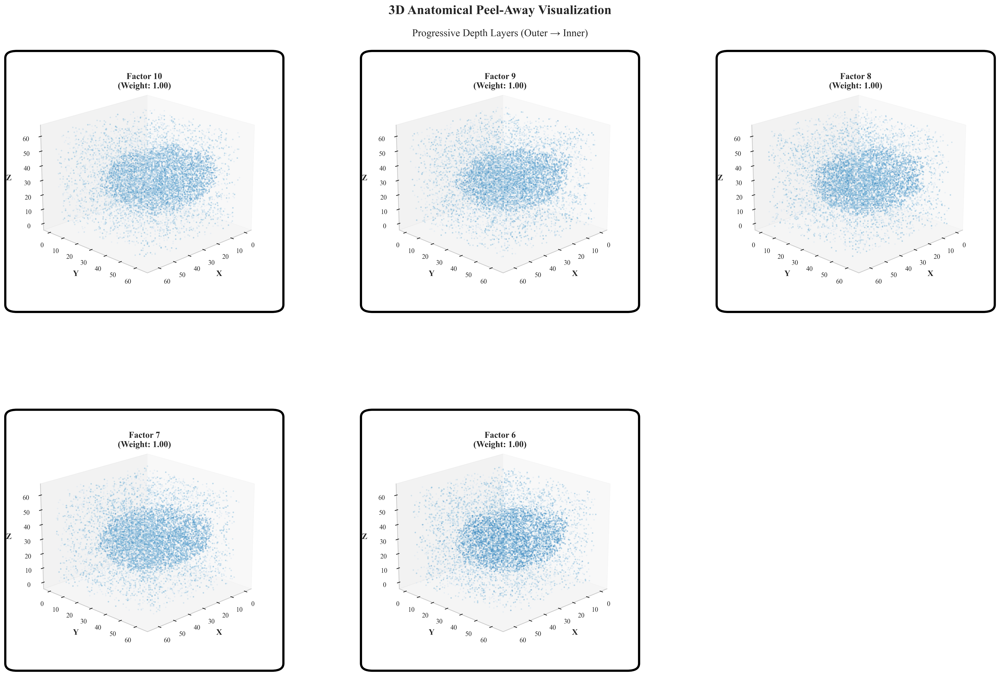


✓ Saved: ..\Anatomical\results\visualizations\01_anatomical_peel_away.png


In [34]:
print("\n" + "="*80)
print("VISUALIZATION 1: 3D ANATOMICAL PEEL-AWAY")
print("="*80)

# Set Times New Roman font
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.serif'] = ['Times New Roman']

# Select top 5 factors by weight
top_factor_indices = np.argsort(weights)[-5:][::-1]

fig = plt.figure(figsize=(22, 14))

# Use GridSpec with spacing
from matplotlib.gridspec import GridSpec
gs = GridSpec(2, 3, figure=fig, hspace=0.55, wspace=0.35, 
              left=0.08, right=0.92, top=0.88, bottom=0.08)

# Define depth layers (from outer to inner)
depth_layers = [0.2, 0.4, 0.6, 0.8, 1.0]
colors = sns.color_palette("Blues", n_colors=5)

for plot_idx, factor_idx in enumerate(top_factor_indices):
    row = plot_idx // 3
    col = plot_idx % 3
    ax = fig.add_subplot(gs[row, col], projection='3d')
    
    factor_vol = spatial_factors_3d[factor_idx]
    
    # Peel-away layers
    for layer_idx, (depth, color) in enumerate(zip(depth_layers, colors)):
        threshold = np.percentile(factor_vol[factor_vol > 0], depth * 100)
        
        # Create mask for this layer
        mask = (factor_vol >= threshold)
        
        # Get voxel coordinates
        z, y, x = np.where(mask)
        
        # Subsample for visualization
        if len(x) > 2000:
            indices = np.random.choice(len(x), 2000, replace=False)
            x, y, z = x[indices], y[indices], z[indices]
        
        # Plot layer
        ax.scatter(x, y, z, c=[color], s=2, alpha=0.3, depthshade=True)
    
    ax.set_xlabel('X', fontsize=11, fontweight='bold', labelpad=5)
    ax.set_ylabel('Y', fontsize=11, fontweight='bold', labelpad=5)
    ax.set_zlabel('Z', fontsize=11, fontweight='bold', labelpad=5)
    
    ax.view_init(elev=20, azim=45)
    ax.grid(False)
    ax.tick_params(labelsize=9)
    
    # Get axis position
    pos = ax.get_position()
    
    # Title INSIDE the box at the top
    fig.text(pos.x0 + pos.width/2, pos.y1 - 0.01,
             f'Factor {factor_idx+1}\n(Weight: {weights[factor_idx]:.2f})',
             ha='center', va='top',
             fontsize=12, fontweight='bold')
    
    # Add ROUNDED RECTANGLE box around each subplot
    from matplotlib.patches import FancyBboxPatch
    fancy_box = FancyBboxPatch(
        (pos.x0 - 0.01, pos.y0 - 0.01),
        pos.width + 0.02, pos.height + 0.02,
        boxstyle="round,pad=0.01",
        linewidth=3,
        edgecolor='black',
        facecolor='none',
        transform=fig.transFigure,
        clip_on=False,
        zorder=100
    )
    fig.patches.append(fancy_box)

# Main title
fig.text(0.5, 0.95, '3D Anatomical Peel-Away Visualization', 
         ha='center', fontsize=18, fontweight='bold')
fig.text(0.5, 0.92, 'Progressive Depth Layers (Outer → Inner)', 
         ha='center', fontsize=14)

save_path = VIZ_DIR / '01_anatomical_peel_away.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✓ Saved: {save_path}")

# Reset font
plt.rcParams['font.family'] = 'DejaVu Sans'


VISUALIZATION 2: MODALITY FINGERPRINT RIBBONS


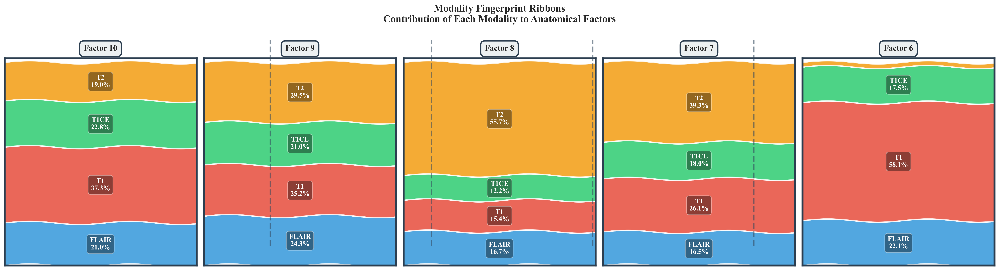


✓ Saved: ..\Anatomical\results\visualizations\02_modality_fingerprint_ribbons.png


In [19]:
print("\n" + "="*80)
print("VISUALIZATION 2: MODALITY FINGERPRINT RIBBONS")
print("="*80)

# Set Times New Roman font
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.serif'] = ['Times New Roman']

fig, axes = plt.subplots(1, 5, figsize=(22, 6))

for ax_idx, factor_idx in enumerate(top_factor_indices):
    ax = axes[ax_idx]
    
    # Get modality contributions for this factor
    contributions = modality_factors[:, factor_idx]
    contributions_norm = contributions / contributions.sum()
    
    # Create ribbon visualization
    y_bottom = 0
    for mod_idx, (mod, contrib) in enumerate(zip(MODALITIES, contributions_norm)):
        y_top = y_bottom + contrib
        
        # Draw ribbon as filled polygon
        x = np.linspace(0, 1, 100)
        y_bot = np.full_like(x, y_bottom)
        y_top_arr = np.full_like(x, y_top)
        
        # Add slight wave for visual interest
        wave = 0.008 * np.sin(x * 12)
        y_bot += wave
        y_top_arr += wave
        
        ax.fill_between(x, y_bot, y_top_arr, 
                        color=MODALITY_COLORS[mod], 
                        alpha=0.85, 
                        edgecolor='white', 
                        linewidth=2.0)
        
        # Add label in center of ribbon
        y_center = (y_bottom + y_top) / 2
        if contrib > 0.1:  # Only label if ribbon is wide enough
            ax.text(0.5, y_center, f'{MODALITY_NAMES[mod]}\n{contrib:.1%}', 
                   ha='center', va='center', fontsize=11, fontweight='bold',
                   family='Times New Roman',
                   color='white', 
                   bbox=dict(boxstyle='round,pad=0.4', 
                            facecolor='black', alpha=0.4, 
                            edgecolor='white', linewidth=1))
        
        y_bottom = y_top
    
    # Add border around each subplot
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1.02)
    
    # Add thick border
    for spine in ax.spines.values():
        spine.set_edgecolor('#2c3e50')
        spine.set_linewidth(3)
        spine.set_visible(True)
    
    # Title with border box
    ax.set_title(f'Factor {factor_idx+1}', 
                fontsize=13, fontweight='bold', pad=12,
                family='Times New Roman',
                bbox=dict(boxstyle='round,pad=0.5', 
                         facecolor='#ecf0f1', 
                         edgecolor='#2c3e50', 
                         linewidth=2))
    
    # Turn off ticks but keep border
    ax.set_xticks([])
    ax.set_yticks([])

# Add separating lines between subplots
for i in range(len(axes) - 1):
    # Get positions of adjacent axes
    pos1 = axes[i].get_position()
    pos2 = axes[i+1].get_position()
    
    # Calculate midpoint
    x_mid = (pos1.x1 + pos2.x0) / 2
    
    # Add vertical line
    fig.add_artist(plt.Line2D([x_mid, x_mid], [0.1, 0.85], 
                              transform=fig.transFigure,
                              color='#34495e', linewidth=2.5, 
                              linestyle='--', alpha=0.6))

plt.suptitle('Modality Fingerprint Ribbons\nContribution of Each Modality to Anatomical Factors', 
             fontsize=16, fontweight='bold', y=0.98,
             family='Times New Roman')

plt.tight_layout(rect=[0, 0, 1, 0.96])

save_path = VIZ_DIR / '02_modality_fingerprint_ribbons.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✓ Saved: {save_path}")

# Reset to original font for other plots
plt.rcParams['font.family'] = 'DejaVu Sans'


VISUALIZATION 3: ANATOMICAL ATOM CONSTELLATION

Computing atom similarity matrix...
Embedding atoms into 2D space (MDS)...
Drawing similarity connections...


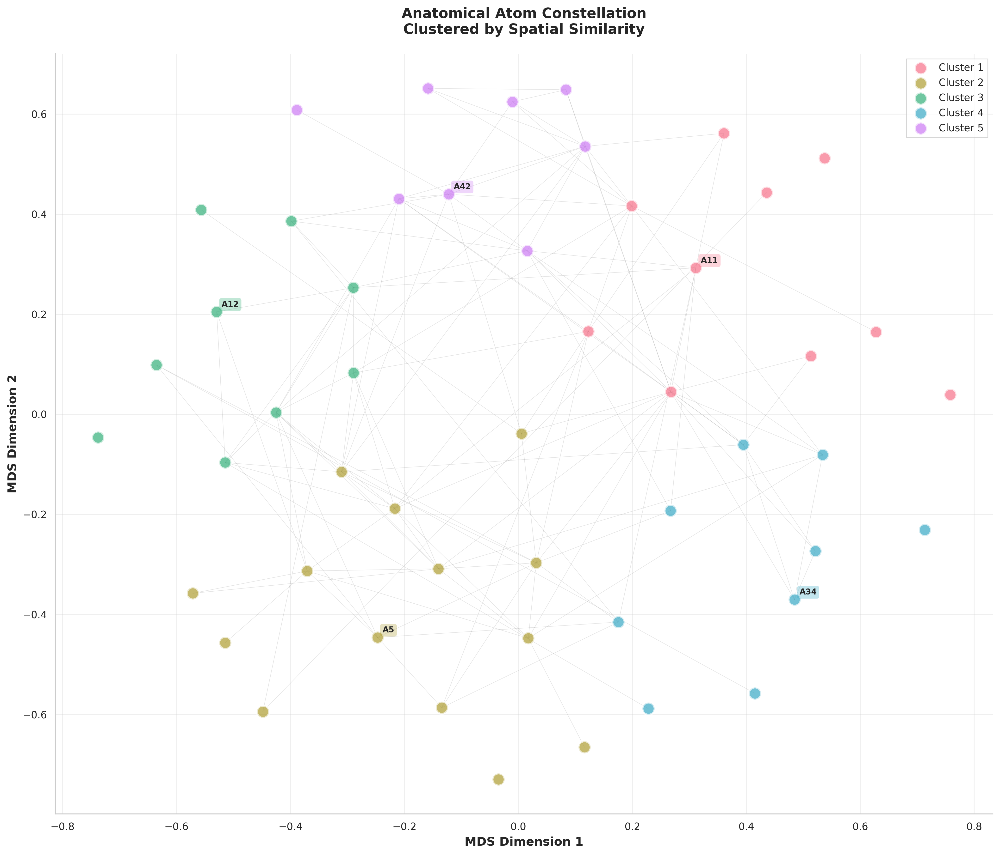


✓ Saved: ..\Anatomical\results\visualizations\03_atom_constellation.png


In [20]:
print("\n" + "="*80)
print("VISUALIZATION 3: ANATOMICAL ATOM CONSTELLATION")
print("="*80)

# Compute pairwise spatial overlap between atoms
print("\nComputing atom similarity matrix...")

atom_similarities = np.zeros((NUM_ATOMS, NUM_ATOMS))
for i in range(NUM_ATOMS):
    for j in range(i+1, NUM_ATOMS):
        # Compute correlation between flattened atoms
        corr = np.corrcoef(atoms_3d[i].flatten(), atoms_3d[j].flatten())[0, 1]
        atom_similarities[i, j] = abs(corr)
        atom_similarities[j, i] = abs(corr)

# Embed in 2D using MDS
print("Embedding atoms into 2D space (MDS)...")
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
distances = 1 - atom_similarities
atom_coords = mds.fit_transform(distances)

# Cluster atoms by k-means
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=42)
atom_clusters = kmeans.fit_predict(atom_coords)

# Visualize constellation
fig, ax = plt.subplots(figsize=(14, 12))

# Draw connections between highly similar atoms
print("Drawing similarity connections...")
threshold = np.percentile(atom_similarities[atom_similarities > 0], 90)
for i in range(NUM_ATOMS):
    for j in range(i+1, NUM_ATOMS):
        if atom_similarities[i, j] > threshold:
            ax.plot([atom_coords[i, 0], atom_coords[j, 0]], 
                   [atom_coords[i, 1], atom_coords[j, 1]], 
                   'gray', alpha=0.2, linewidth=0.5, zorder=1)

# Plot atoms colored by cluster
colors = sns.color_palette("husl", n_colors=5)
for cluster_id in range(5):
    mask = atom_clusters == cluster_id
    ax.scatter(atom_coords[mask, 0], atom_coords[mask, 1], 
              c=[colors[cluster_id]], s=150, alpha=0.7, 
              edgecolors='white', linewidths=2, 
              label=f'Cluster {cluster_id+1}', zorder=2)

# Add atom numbers for a few representative atoms
for cluster_id in range(5):
    cluster_atoms = np.where(atom_clusters == cluster_id)[0]
    if len(cluster_atoms) > 0:
        # Label centroid atom
        centroid = atom_coords[cluster_atoms].mean(axis=0)
        closest = cluster_atoms[np.argmin(np.linalg.norm(atom_coords[cluster_atoms] - centroid, axis=1))]
        ax.annotate(f'A{closest+1}', 
                   xy=(atom_coords[closest, 0], atom_coords[closest, 1]),
                   xytext=(5, 5), textcoords='offset points',
                   fontsize=8, fontweight='bold',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor=colors[cluster_id], 
                            alpha=0.3, edgecolor='none'))

ax.set_xlabel('MDS Dimension 1', fontsize=12, fontweight='bold')
ax.set_ylabel('MDS Dimension 2', fontsize=12, fontweight='bold')
ax.set_title('Anatomical Atom Constellation\nClustered by Spatial Similarity', 
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='upper right', frameon=True, fancybox=False, fontsize=10)
ax.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
save_path = VIZ_DIR / '03_atom_constellation.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Saved: {save_path}")


VISUALIZATION 4: FACTOR ACTIVATION TRAJECTORIES


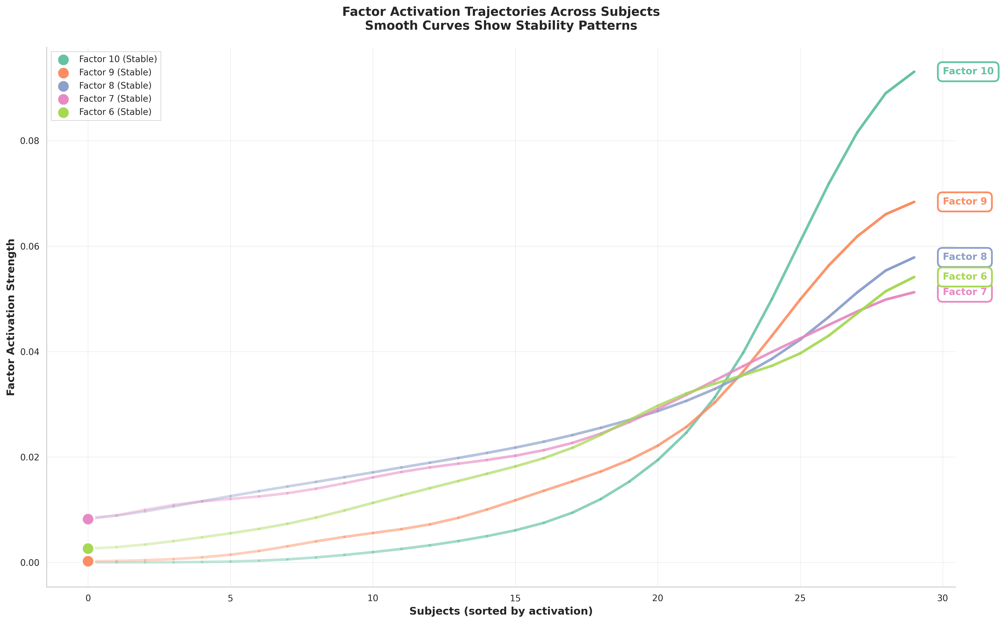


✓ Saved: ..\Anatomical\results\visualizations\04_activation_trajectories.png


In [15]:
print("\n" + "="*80)
print("VISUALIZATION 4: FACTOR ACTIVATION TRAJECTORIES")
print("="*80)

fig, ax = plt.subplots(figsize=(16, 10))

# Get top 5 factors
colors_traj = sns.color_palette("Set2", n_colors=5)

# Smooth trajectories using Gaussian filtering
from scipy.ndimage import gaussian_filter1d

for traj_idx, factor_idx in enumerate(top_factor_indices):
    # Get subject activations for this factor
    activations = subject_factors[:, factor_idx]
    
    # Sort subjects by activation (creates smooth trajectory)
    sorted_indices = np.argsort(activations)
    sorted_activations = activations[sorted_indices]
    
    # Smooth trajectory
    smoothed = gaussian_filter1d(sorted_activations, sigma=2)
    
    # Create smooth curve
    x = np.arange(len(smoothed))
    y = smoothed
    
    # Plot trajectory with gradient color
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    
    # Create gradient from light to dark
    colors_gradient = [colors_traj[traj_idx] for _ in range(len(segments))]
    alphas = np.linspace(0.3, 1.0, len(segments))
    
    for seg_idx, (seg, alpha) in enumerate(zip(segments, alphas)):
        ax.plot(seg[:, 0], seg[:, 1], 
               color=colors_traj[traj_idx], 
               linewidth=3, alpha=alpha, 
               solid_capstyle='round')
    
    # Add label at end
    ax.text(x[-1] + 1, y[-1], f'Factor {factor_idx+1}', 
           fontsize=11, fontweight='bold', va='center',
           color=colors_traj[traj_idx],
           bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
                    edgecolor=colors_traj[traj_idx], linewidth=2))
    
    # Mark stable vs variable regions
    variance = np.var(sorted_activations)
    stability = "Stable" if variance < 0.01 else "Variable"
    ax.scatter([x[0]], [y[0]], s=200, c=[colors_traj[traj_idx]], 
              marker='o', edgecolors='white', linewidths=2, zorder=10,
              label=f'Factor {factor_idx+1} ({stability})')

ax.set_xlabel('Subjects (sorted by activation)', fontsize=12, fontweight='bold')
ax.set_ylabel('Factor Activation Strength', fontsize=12, fontweight='bold')
ax.set_title('Factor Activation Trajectories Across Subjects\nSmooth Curves Show Stability Patterns', 
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='upper left', frameon=True, fancybox=False, fontsize=10)
ax.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
save_path = VIZ_DIR / '04_activation_trajectories.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Saved: {save_path}")


VISUALIZATION 5: SPATIAL EXCLUSIVITY CARVINGS


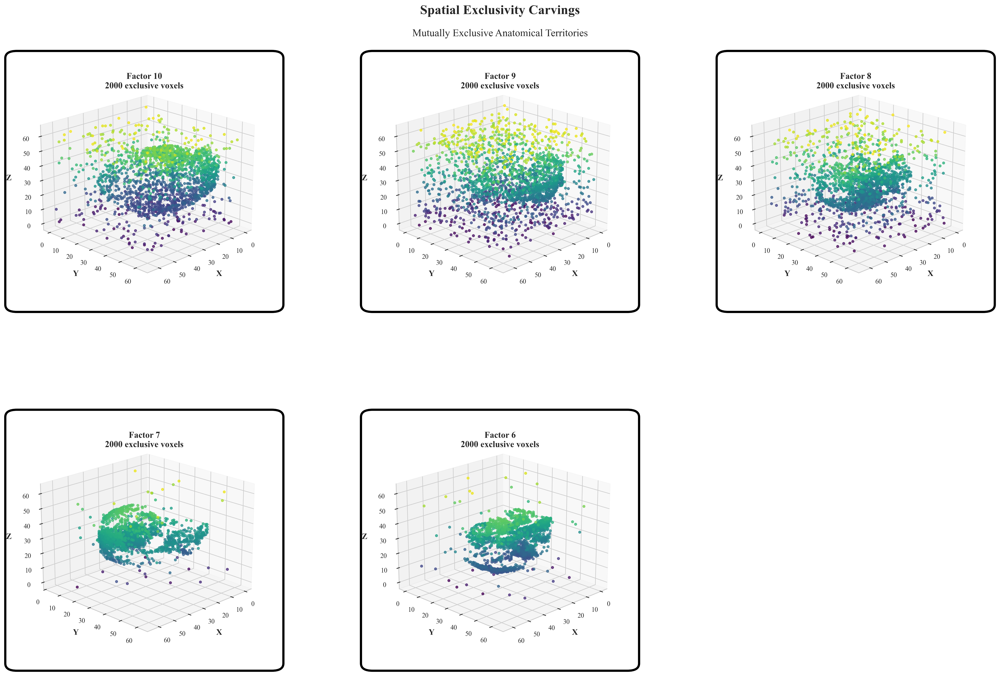


✓ Saved: ..\Anatomical\results\visualizations\05_spatial_exclusivity.png


In [33]:
print("\n" + "="*80)
print("VISUALIZATION 5: SPATIAL EXCLUSIVITY CARVINGS")
print("="*80)

# Set Times New Roman font
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.serif'] = ['Times New Roman']

fig = plt.figure(figsize=(22, 14))

# Use GridSpec with spacing
from matplotlib.gridspec import GridSpec
gs = GridSpec(2, 3, figure=fig, hspace=0.55, wspace=0.35, 
              left=0.08, right=0.92, top=0.88, bottom=0.08)

for plot_idx, factor_idx in enumerate(top_factor_indices):
    row = plot_idx // 3
    col = plot_idx % 3
    ax = fig.add_subplot(gs[row, col], projection='3d')
    
    factor_vol = spatial_factors_3d[factor_idx]
    
    # Find exclusive regions
    all_factors_at_voxel = spatial_factors_3d[:, :, :, :]
    max_factor_per_voxel = np.argmax(all_factors_at_voxel, axis=0)
    exclusive_mask = (max_factor_per_voxel == factor_idx) & (factor_vol > np.percentile(factor_vol, 75))
    
    # Get coordinates
    z, y, x = np.where(exclusive_mask)
    
    # Subsample
    if len(x) > 2000:
        indices = np.random.choice(len(x), 2000, replace=False)
        x, y, z = x[indices], y[indices], z[indices]
    
    # Color by depth
    colors_carve = plt.cm.viridis(z / VOLUME_SIZE)
    
    # Plot
    ax.scatter(x, y, z, c=colors_carve, s=10, alpha=0.75, depthshade=True)
    
    ax.set_xlabel('X', fontsize=11, fontweight='bold', labelpad=5)
    ax.set_ylabel('Y', fontsize=11, fontweight='bold', labelpad=5)
    ax.set_zlabel('Z', fontsize=11, fontweight='bold', labelpad=5)
    
    ax.view_init(elev=20, azim=45)
    ax.grid(True, alpha=0.2)
    ax.tick_params(labelsize=9)
    
    # Get axis position
    pos = ax.get_position()
    
    # Title INSIDE the box at the top
    fig.text(pos.x0 + pos.width/2, pos.y1 - 0.01,
             f'Factor {factor_idx+1}\n{len(x)} exclusive voxels',
             ha='center', va='top',
             fontsize=12, fontweight='bold')
    
    # Add ROUNDED RECTANGLE box around each subplot (AFTER title so title is inside)
    from matplotlib.patches import FancyBboxPatch
    fancy_box = FancyBboxPatch(
        (pos.x0 - 0.01, pos.y0 - 0.01),
        pos.width + 0.02, pos.height + 0.02,
        boxstyle="round,pad=0.01",
        linewidth=3,
        edgecolor='black',
        facecolor='none',
        transform=fig.transFigure,
        clip_on=False,
        zorder=100
    )
    fig.patches.append(fancy_box)

# Main title at TOP
fig.text(0.5, 0.95, 'Spatial Exclusivity Carvings', 
         ha='center', fontsize=18, fontweight='bold')
fig.text(0.5, 0.92, 'Mutually Exclusive Anatomical Territories', 
         ha='center', fontsize=14)

save_path = VIZ_DIR / '05_spatial_exclusivity.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✓ Saved: {save_path}")

plt.rcParams['font.family'] = 'DejaVu Sans'